# <center> Coconut palms detection </center>

## Importing libraries

In [1]:
import torch
import torchvision
import torchvision.transforms as transforms
import torch.optim as optim
import torch.nn as nn
import torchvision.models as models
from torchvision.utils import draw_bounding_boxes
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from numpy import loadtxt
from osgeo import gdal
from osgeo import gdal_array
import math
import geopandas as gpd
from myfunctions import diagonalcorners, geoCoord2PixelPosition2, geoCoord2PixelPosition

print("Libraries successfully imported!")

Libraries successfully imported!


## Loading variables

In [2]:
corners_array_groundtruth = np.load('../tables/train_corners_groundtruth.npy')

## Loading model and activating GPU

In [3]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print('Using {} device'.format(device))

Using cuda device


In [4]:
# model_name = 'resnet18_nopretr_35epochs2_data_augmentation'
# model_name = "resnet18_nopretr_35epochs"
# model_name = 'resnet18_pretr_35epochs2_data_augmentation'
# model_name = 'resnet18_pretr_200epochs_data_augmentation_L2'
model_name = 'resnet18_pretr_300epochs_data_augmentation_rot_L2_lr'
path_to_model = "../models/" + model_name + ".pth"

net = models.resnet18(pretrained=False) 
net.fc = torch.nn.Linear(512, 2)  
net.load_state_dict(torch.load(path_to_model))

print("Model successfully loaded!")

net.to(device)
print("The model is in the GPU.")

Model successfully loaded!
The model is in the GPU.


## Loading raster as array and saving shape

In [6]:
rgb_array = np.load('../tables/rgb_train.npy')

print(f"The dimensions of the RGB array are {rgb_array.shape}")

array_height = rgb_array.shape[0]
array_width = rgb_array.shape[1]

The dimensions of the RGB array are (4860, 17761, 3)


## Computing moving window parameters

In [7]:
moving_window_step = 15

steps_nb_y = int((array_height-90) / moving_window_step)
print(f" The number of steps in the y direction is :{steps_nb_y}")

steps_nb_x = int((array_width-90) / moving_window_step)
print(f" The number of steps in the x direction is :{steps_nb_x}")

 The number of steps in the y direction is :318
 The number of steps in the x direction is :1178


In [8]:
step_x = 0
step_y = 0
windows_nb = 0
for step_x in range(steps_nb_x):
    for step_y in range(steps_nb_y):
        windows_nb = windows_nb + 1
print(f"Number of total steps is {windows_nb}") 

Number of total steps is 374604


In [9]:
transform = transforms.Compose(   
            [transforms.ToTensor(), 
             transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.22))]) 

In [10]:
batch_size = 100

complete_batches = math.floor(windows_nb / batch_size)

last_batch_number = complete_batches + 1

last_batch = windows_nb % batch_size

print(f"The number of complete batches is {complete_batches}.")

print(f"The last batch is the batch number {last_batch_number}.")

print(f"The number of elements in the last batch is {last_batch}.")

print(f"The number of windows is {windows_nb} and the computed number of windows is {complete_batches*batch_size+last_batch}.")

The number of complete batches is 3746.
The last batch is the batch number 3747.
The number of elements in the last batch is 4.
The number of windows is 374604 and the computed number of windows is 374604.


## Screening of the raster with the moving window

In [13]:
window_count = 0
step_x = 0
step_y = 0
corners = []
scores = []
groundtruth = []
percentage = 0
box_edge = 90
batch = []
batch_step_x = []
batch_step_y = []
batch_count = 1
iou_list = []

print("Screening of the image for objects started!")

# double loop for image screening
with torch.no_grad():
    for step_y in range(steps_nb_y):
        for step_x in range(steps_nb_x):
            
            # selecting one frame of the image
            im = Image.fromarray(rgb_array[(step_y*moving_window_step):(step_y*moving_window_step + box_edge),
                                                    (step_x*moving_window_step):(step_x*moving_window_step + box_edge), :], 'RGB')                       
            transformed_im = transform(im)
            im_reshaped = torch.reshape(transformed_im, (1,3,box_edge,box_edge))

            # batch of images for input to the model
            if len(batch) < batch_size:
                batch.append(im_reshaped)
                batch_step_x.append(step_x)
                batch_step_y.append(step_y)
            
            # if batch complete, format list to tensor and compute probabilities
            if len(batch) == batch_size or (batch_count == last_batch_number and len(batch) == last_batch):

                batch_cat = torch.cat(batch, 0)
                batch_step_x = np.asarray(batch_step_x)
                batch_step_y = np.asarray(batch_step_y)

                batch_gpu = batch_cat.to(device)
                output = net(batch_gpu)
                pred_probab = nn.Softmax(dim=1)(output)
                pred_probab_palm = pred_probab[:,1]
            
                for i in range(len(batch)):
                       
                    # saving corners and palm probability for each window
                    x1,y1,x2,y2 = diagonalcorners(batch_step_x[i]*moving_window_step+45, 
                                                  batch_step_y[i]*moving_window_step+45, box_edge)
                    corners.append([x1,y1,x2,y2])
                    scores.append(float(pred_probab_palm[i])) 

                    #computing iou of every window with groundtruth
                    iou_matrix = torchvision.ops.box_iou(torch.from_numpy(corners_array_groundtruth), 
                                                         torch.from_numpy(np.asarray([[x1,y1,x2,y2]])))
                    iou_list.append(torch.max(iou_matrix).item())

                batch_count += 1
                batch = []
                batch_step_x = []
                batch_step_y = []

            # display computation advances        
            if window_count % math.floor(windows_nb/10) == (math.floor(windows_nb/10)-1):
                percentage += 10
                print(f"We processed {window_count} windows, which corresponds to {percentage}% of the image.")
                
            window_count = window_count + 1

print("\n Screening of the image for objects ended!") 

Screening of the image for objects started!
We processed 37459 windows, which corresponds to 10% of the image.
We processed 74919 windows, which corresponds to 20% of the image.
We processed 112379 windows, which corresponds to 30% of the image.
We processed 149839 windows, which corresponds to 40% of the image.
We processed 187299 windows, which corresponds to 50% of the image.
We processed 224759 windows, which corresponds to 60% of the image.
We processed 262219 windows, which corresponds to 70% of the image.
We processed 299679 windows, which corresponds to 80% of the image.
We processed 337139 windows, which corresponds to 90% of the image.
We processed 374599 windows, which corresponds to 100% of the image.

 Screening of the image for objects ended!


## Setting lists to arrays and reshaping

In [14]:
scores_array = np.asarray(scores)
corners_array = np.asarray(corners)
iou_array = np.asarray(iou_list)

scores_array = scores_array.reshape(scores_array.shape[0],1)
iou_array = iou_array.reshape(iou_array.shape[0],1)

print(f'The shape of {"scores_array"} is {scores_array.shape}.\n')

The shape of scores_array is (374604, 1).



## Saving variables

In [15]:
np.save('../tables/train_scores_array.npy', scores_array)
np.save('../tables/train_iou_array.npy', iou_array)
np.save('../tables/train_corners_array.npy', corners_array)

print('.npy saved!')

.npy saved!


## Loading values

In [16]:
scores_array = np.load('../tables/train_scores_array.npy')
iou_array = np.load('../tables/train_iou_array.npy')
corners_array = np.load('../tables/train_corners_array.npy')

## Histogram of probabilities

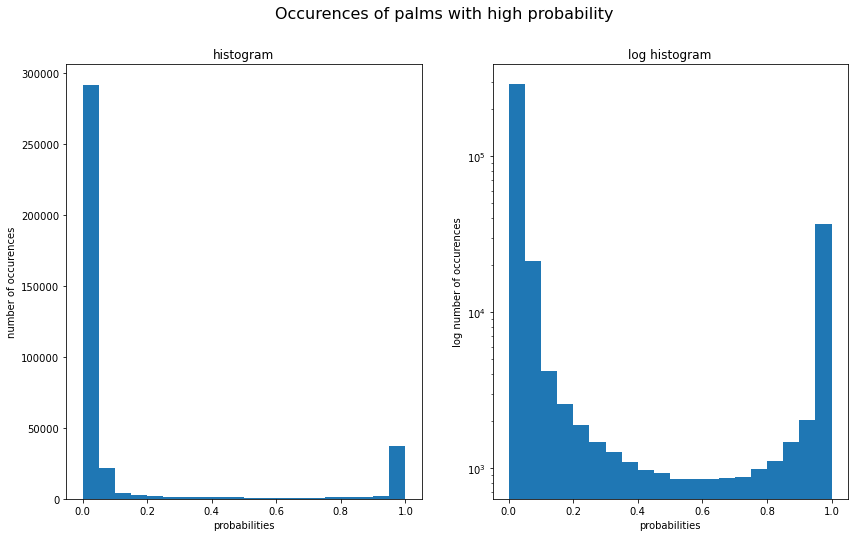

The number of elements is 374604 and the number of elements above 0.9 is 38932.


In [17]:
fig, axs = plt.subplots(1, 2, figsize = (14,8))

axs[0].hist(scores_array, bins = 20)
axs[0].set_xlabel('probabilities')
axs[0].set_ylabel('number of occurences')
axs[0].set_title('histogram')

axs[1].hist(scores_array, bins = 20, log = True)
axs[1].set_xlabel('probabilities')
axs[1].set_ylabel('log number of occurences')
axs[1].set_title('log histogram')

fig.suptitle('Occurences of palms with high probability', fontsize=16)
plt.show()

palms_above_threshold = 0.90
print(f'The number of elements is {scores_array.shape[0]} and the number of elements above {palms_above_threshold} is {(scores_array>palms_above_threshold).sum()}.')

## Histogram of IOU with groundtruth

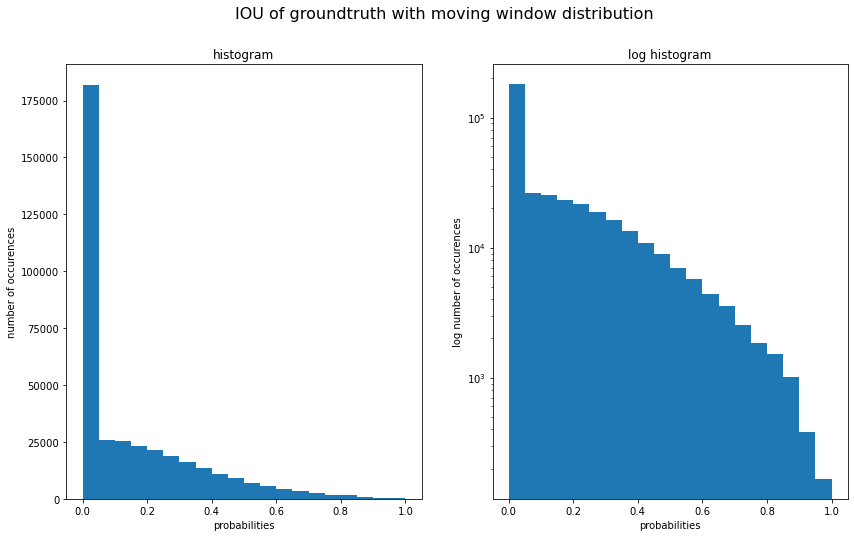

The number of elements is 374604 and the number of elements above 0.8 is 3066.


In [18]:
fig, axs = plt.subplots(1, 2, figsize = (14,8))

axs[0].hist(iou_array, bins = 20)
axs[0].set_xlabel('probabilities')
axs[0].set_ylabel('number of occurences')
axs[0].set_title('histogram')

axs[1].hist(iou_array, bins = 20, log = True)
axs[1].set_xlabel('probabilities')
axs[1].set_ylabel('log number of occurences')
axs[1].set_title('log histogram')

fig.suptitle('IOU of groundtruth with moving window distribution', fontsize=16)
plt.show()

print(f'The number of elements is {iou_array.shape[0]} and the number of elements above 0.8 is {(iou_array>0.8).sum()}.')

## Visualizing groundtruth boxes

In [19]:

rgb_array = rgb_array.transpose(2,0,1)
rasterTensor = torch.from_numpy(rgb_array)
graph_xsize = 2000
graph_ysize = 2000

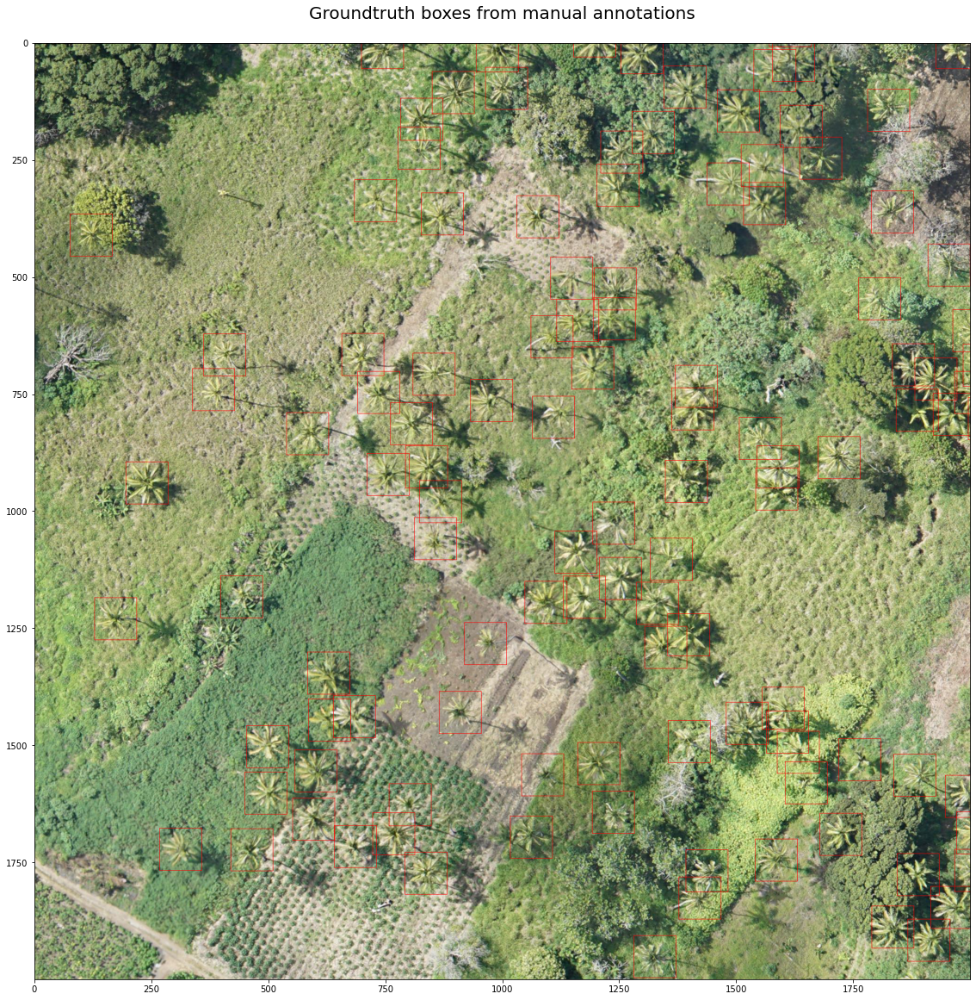

The number of groundtruth palms in the test set is 3147.


In [22]:
drawn_boxes = draw_bounding_boxes(rasterTensor, torch.from_numpy(corners_array_groundtruth), colors="red")

drawn_boxes_array = np.asarray(drawn_boxes)
drawn_boxes_array = drawn_boxes_array.transpose(1,2,0)

plt.figure(figsize=(20,20))
plt.imshow(np.asarray(drawn_boxes_array[-graph_ysize:,:graph_xsize,:]))
plt.title('Groundtruth boxes from manual annotations\n', fontsize=20)
plt.show()

print(f'The number of groundtruth palms in the test set is {corners_array_groundtruth.shape[0]}.')

## Visualizing groundtruth boxes after IOU with moving window

In [23]:
groundtruth_threshold = 0.72
corners_array_iou = corners_array[np.where(iou_array > groundtruth_threshold)[0],:]
drawn_boxes = draw_bounding_boxes(rasterTensor, torch.from_numpy(corners_array_iou))

drawn_boxes_array = np.asarray(drawn_boxes)
drawn_boxes_array = drawn_boxes_array.transpose(1,2,0)
'''
plt.figure(figsize=(20,20))
plt.imshow(np.asarray(drawn_boxes_array[-graph_ysize:,:graph_xsize,:]))
plt.title('Groundtruth boxes from IoU with moving window\n', fontsize=20)
plt.show()
'''
print(f'The number of groundtruth palms obtained with this method is {corners_array_iou.shape[0]}.')

The number of groundtruth palms obtained with this method is 6371.


## Visualizing boxes according to score

In [24]:
score_threshold = 0.5

corners_array_score = corners_array[np.where(scores_array>score_threshold)[0],:]
scores_array_score = scores_array[np.where(scores_array>score_threshold)[0],:]

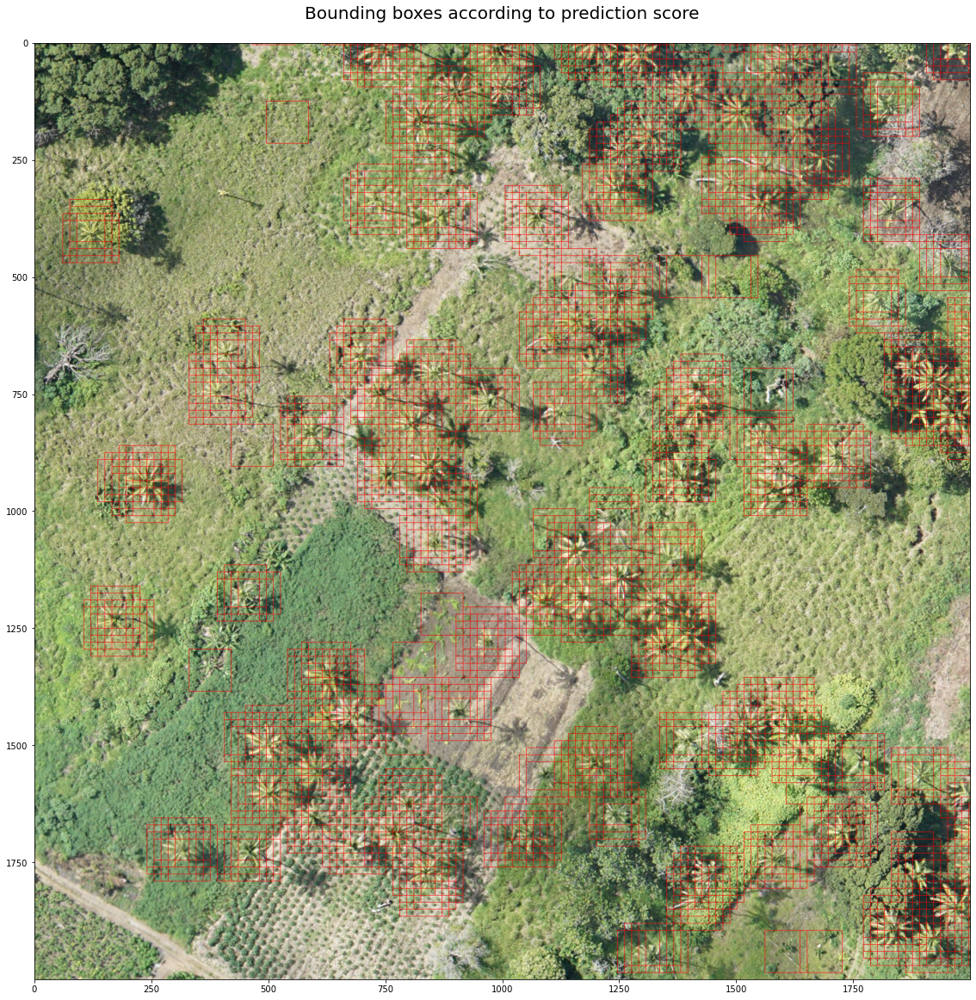

In [25]:
drawn_boxes = draw_bounding_boxes(rasterTensor, torch.from_numpy(corners_array_score), colors="red")

drawn_boxes_array = np.asarray(drawn_boxes)
drawn_boxes_array = drawn_boxes_array.transpose(1,2,0)

plt.figure(figsize=(20,20))
plt.imshow(np.asarray(drawn_boxes_array[-graph_ysize:,:graph_xsize,:]))
plt.title('Bounding boxes according to prediction score\n', fontsize=20)
plt.show()

## Visualizing boxes after NMS

In [26]:
iou_threshold = float(0.15)

indices = np.ones(corners_array_score.shape[0])
indices_tensor = torch.from_numpy(indices)
corners_tensor = torch.from_numpy(corners_array_score)
corners_tensor = corners_tensor.type(torch.float)
scores_tensor = torch.from_numpy(scores_array_score.flatten())
scores_tensor = scores_tensor.type(torch.float)

In [27]:
selected_indices = torchvision.ops.batched_nms(corners_tensor, scores_tensor, indices_tensor, iou_threshold)

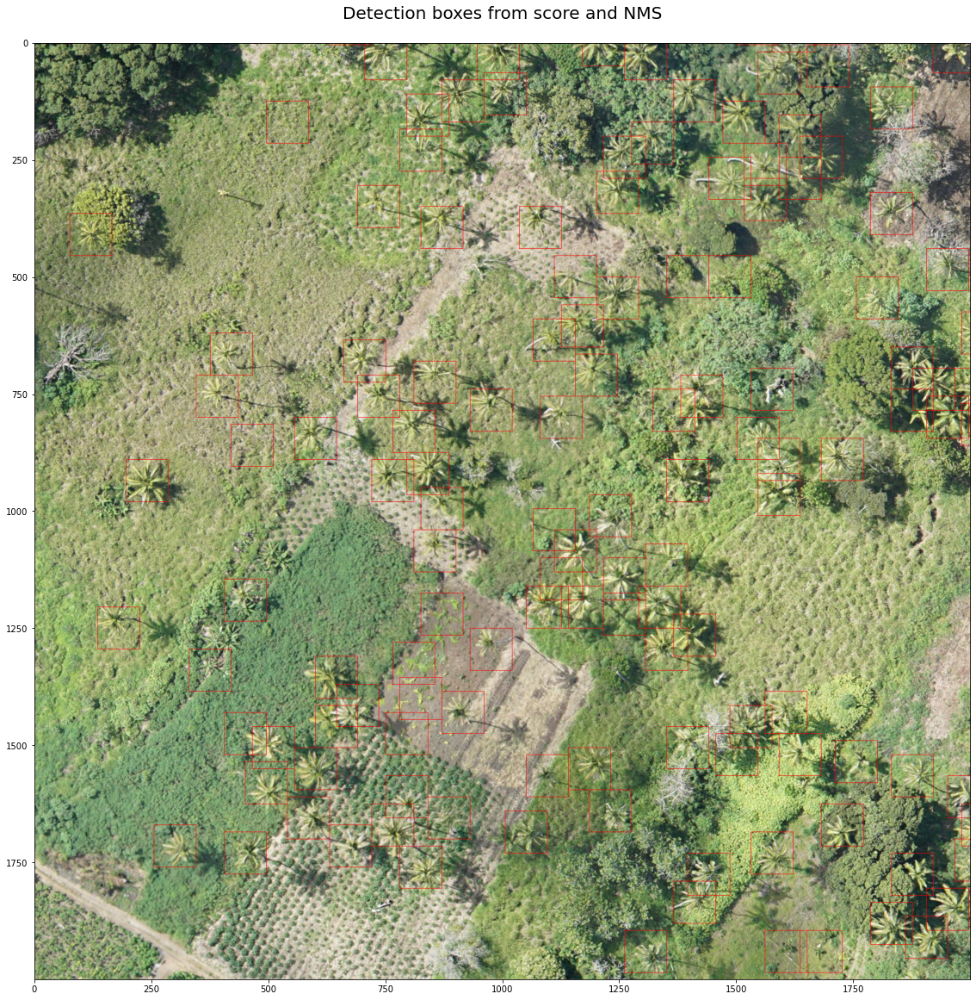

The number of detections after NMS is 3536.


In [28]:
drawn_boxes = draw_bounding_boxes(rasterTensor, torch.from_numpy(corners_array_score[selected_indices]), colors="red")

drawn_boxes_array = np.asarray(drawn_boxes)
drawn_boxes_array = drawn_boxes_array.transpose(1,2,0)

plt.figure(figsize=(20,20))
plt.imshow(np.asarray(drawn_boxes_array[-graph_ysize:,:graph_xsize,:]))
plt.title('Detection boxes from score and NMS\n', fontsize=20)
plt.show()

print(f'The number of detections after NMS is {selected_indices.shape[0]}.')

## Saving some variables

In [29]:
iou_nms = torchvision.ops.box_iou(torch.from_numpy(corners_array_groundtruth), 
                                  torch.from_numpy(corners_array_score[selected_indices]))

np.save('../tables/train_iou_nms.npy', iou_nms.cpu().numpy())
np.save('../tables/train_detection_corners_nms.npy', corners_array_score[selected_indices])
np.save('../tables/train_detection_scores_nms.npy', scores_array_score[selected_indices])

## Displaying some FP

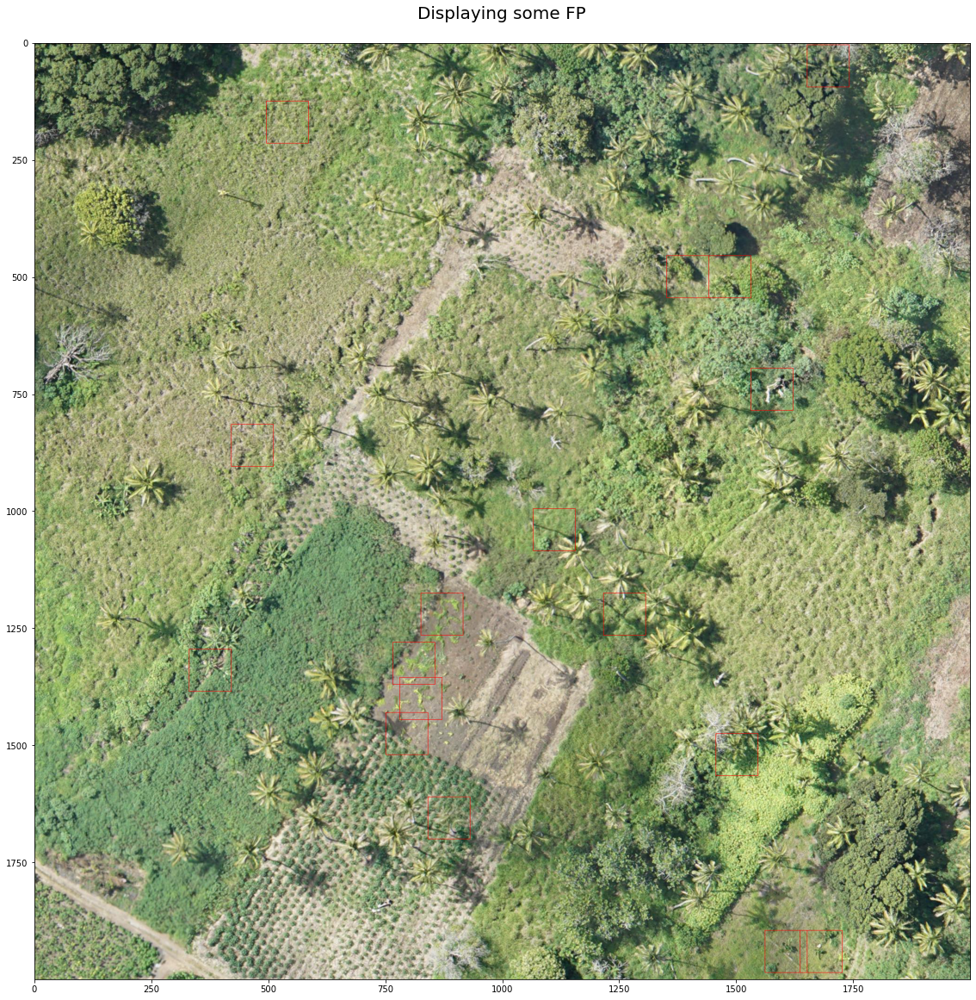

The number of FP after NMS is 411.


In [30]:
FP_index = ((iou_nms > iou_threshold).sum(axis = 0) ==0)

FP_corners = corners_array_score[selected_indices][FP_index]

drawn_boxes = draw_bounding_boxes(rasterTensor, torch.from_numpy(FP_corners), colors="red")

drawn_boxes_array = np.asarray(drawn_boxes)
drawn_boxes_array = drawn_boxes_array.transpose(1,2,0)

plt.figure(figsize=(20,20))
plt.imshow(np.asarray(drawn_boxes_array[-graph_ysize:,:graph_xsize,:]))
plt.title('Displaying some FP\n', fontsize=20)
plt.show()

print(f'The number of FP after NMS is {FP_corners.shape[0]}.')

## Displaying some FN

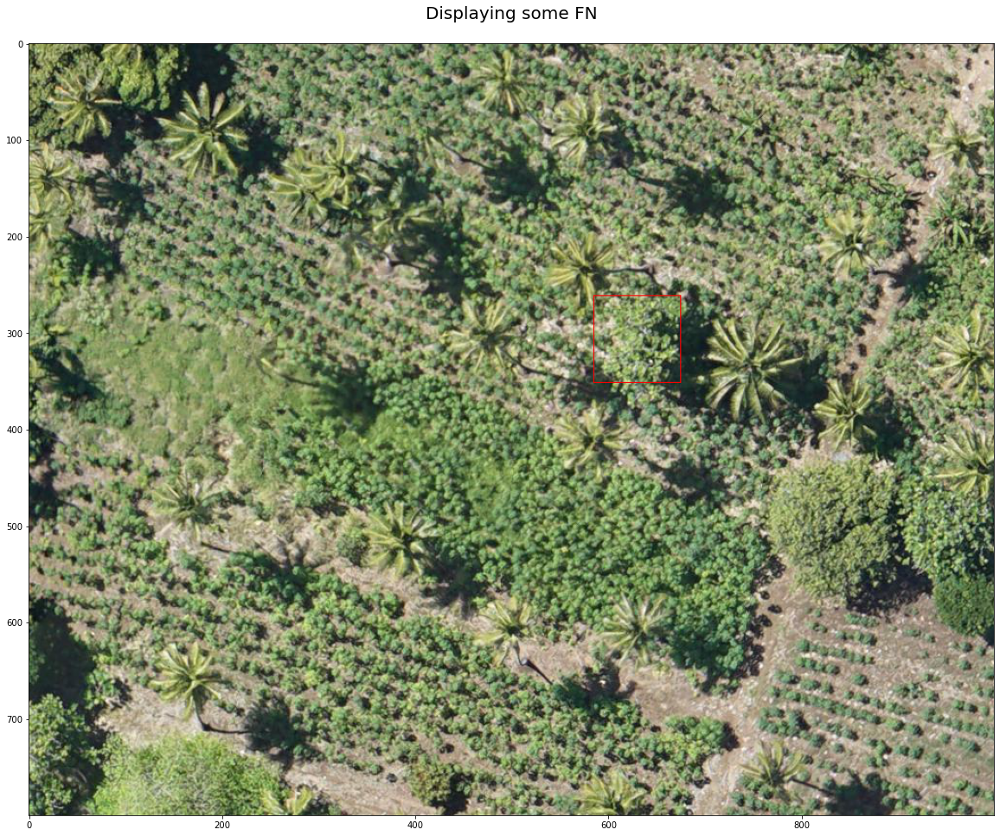

The number of FN after NMS is 17.


In [35]:
FN_index = ((iou_nms > iou_threshold).sum(axis = 1) ==0)

FN_corners = corners_array_groundtruth[FN_index]

drawn_boxes = draw_bounding_boxes(rasterTensor, torch.from_numpy(FN_corners), colors="red")

drawn_boxes_array = np.asarray(drawn_boxes)
drawn_boxes_array = drawn_boxes_array.transpose(1,2,0)

plt.figure(figsize=(20,20))
plt.imshow(np.asarray(drawn_boxes_array[3200:4000,9500:10500,:]))
plt.title('Displaying some FN\n', fontsize=20)
plt.show()

print(f'The number of FN after NMS is {FN_corners.shape[0]}.')

In [32]:
FN_corners

array([[10085,  3461, 10175,  3551],
       [11568,  4793, 11658,  4883],
       [11391,  4811, 11481,  4901],
       [11079,  4784, 11169,  4874],
       [10126,  4800, 10216,  4890],
       [ 2789,  4812,  2879,  4902],
       [ 4739,  4801,  4829,  4891],
       [ 3603,  4798,  3693,  4888],
       [ 3474,  4810,  3564,  4900],
       [ 3924,  4178,  4014,  4268],
       [ 2104,  4810,  2194,  4900],
       [ 6878,  2637,  6968,  2727],
       [ 6870,  2494,  6960,  2584],
       [ 8332,  2728,  8422,  2818],
       [ 6111,  4802,  6201,  4892],
       [ 3210,  4781,  3300,  4871],
       [11197,  4799, 11287,  4889]])

In [28]:
print('End of notebook!')

End of notebook!
